<a href="https://colab.research.google.com/github/look4pritam/ArtificialIntelligence/blob/master/ConvolutionalNeuralNetwork/Notebooks/Autoencoder/DenoiseDocuments.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Denoise Dirty Documents using Deep Learning

In this assignment, we will learn to remove noise from printed text using [Convolutional Neural Network](https://en.wikipedia.org/wiki/Convolutional_neural_network) (CNN). 

We will use a CNN based [autoencoder](https://en.wikipedia.org/wiki/Autoencoder) for noise removal. 

See [link](https://www.kaggle.com/c/denoising-dirty-documents/) for more details.

## Set the root directory for processing.

In [1]:
import os

root_dir = '/content/'
os.chdir(root_dir)

!ls -al

total 20
drwxr-xr-x 1 root root 4096 Dec 20 05:16 .
drwxr-xr-x 1 root root 4096 Dec 20 05:16 ..
drwxr-xr-x 4 root root 4096 Dec 16 21:14 .config
-rw-r--r-- 1 root root   67 Dec 20 05:16 kaggle.json
drwxr-xr-x 1 root root 4096 Dec 16 21:15 sample_data


## Set kaggle API token.
Create Kaggle API token. Upload the token 'kaggle.json' at '/content/' directory.

In [2]:
os.environ['KAGGLE_CONFIG_DIR'] = root_dir

In [3]:
!chmod 600 /content/kaggle.json

## Download kaggle dataset for further processing.

In [4]:
!kaggle competitions download -c denoising-dirty-documents

 81% 29.0M/35.7M [00:00<00:00, 152MB/s] 
100% 35.7M/35.7M [00:00<00:00, 156MB/s]


In [5]:
!unzip denoising-dirty-documents.zip

Archive:  denoising-dirty-documents.zip
  inflating: sampleSubmission.csv.zip  
  inflating: test.zip                
  inflating: train.zip               
  inflating: train_cleaned.zip       


In [6]:
train = os.path.join(root_dir, 'train.zip')
train_cleaned = os.path.join(root_dir, 'train_cleaned.zip')
test = os.path.join(root_dir, 'test.zip')

## Define a helper function to extract compressed files.

In [7]:
from zipfile import ZipFile 

def extract_zip_file(file_names):
    for file in file_names:
        with ZipFile(file, 'r') as zip: 
            zip.extractall() 

extract_zip_file([train, train_cleaned, test])

In [8]:
import glob

train_images = sorted(glob.glob('train/*.png'))
train_cleaned_images = sorted(glob.glob('train_cleaned/*.png'))
test_images = sorted(glob.glob('test/*.png'))

## Import required python modules.

In [9]:
import numpy as np
np.random.seed(7)

## Convert images to array for further processing.

In [10]:
from tensorflow.keras.preprocessing.image import load_img, array_to_img, img_to_array

def convert_images_to_array(images_folder, test=False):
    images = []
    for img_dir in images_folder:
        image = load_img(img_dir, color_mode='grayscale', target_size=(258, 540, 1))
        image = img_to_array(image).astype('float32') / 255.0
        images.append(image)
    return np.asarray(images)

In [11]:
X_train_full = convert_images_to_array(train_images)
Y_train_full = convert_images_to_array(train_cleaned_images)

## Create training and validation dataset.

In [12]:
import sklearn
assert sklearn.__version__ >= "0.20"
from sklearn.model_selection import train_test_split

X_train, X_val, Y_train, Y_val = train_test_split(X_train_full, Y_train_full, test_size=0.2, random_state=42)

## Import required python modules.

In [13]:
import tensorflow as tf
from tensorflow import keras

from keras.models import Model
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Input

## Define CNN based autoencoder model.

In [14]:
def build_autoenocder():
    input_image = Input(shape=(None,None,1), name='input-image')
    
    #enoder 
    x = Conv2D(32, (3,3), activation='relu', padding='same', name='conv2D-1')(input_image)
    x = Conv2D(64, (3,3), activation='relu', padding='same', name='conv2D-2')(x)
    x = MaxPooling2D((2,2), padding='same', name='pool-1')(x)
    
    #decoder
    x = Conv2D(64, (3,3), activation='relu', padding='same', name='conv2D-3')(x)
    x = Conv2D(32, (3,3), activation='relu', padding='same', name='conv2D-4')(x)
    x = UpSampling2D((2,2), name='upsample-1')(x)
    output_image = Conv2D(1, (3,3), activation='sigmoid', padding='same', name='predicted-image')(x)
    
    #model
    autoencoder = Model(inputs=input_image, outputs=output_image)
    return(autoencoder)

In [15]:
model = build_autoenocder()
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input-image (InputLayer)    [(None, None, None, 1)]   0         
                                                                 
 conv2D-1 (Conv2D)           (None, None, None, 32)    320       
                                                                 
 conv2D-2 (Conv2D)           (None, None, None, 64)    18496     
                                                                 
 pool-1 (MaxPooling2D)       (None, None, None, 64)    0         
                                                                 
 conv2D-3 (Conv2D)           (None, None, None, 64)    36928     
                                                                 
 conv2D-4 (Conv2D)           (None, None, None, 32)    18464     
                                                                 
 upsample-1 (UpSampling2D)   (None, None, None, 32)    0     

## Compile the model.
- Use Adam optimizer.
- Use Mean Squared Error (MSE) as a loss function.
- Use Mean Absolute Error (MAE) as a performance metric.


In [16]:
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

## Define callback functions.
- Define callback function to reduce learning rate after saturation.
- Define callback function for early stopping.

In [17]:
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_mae', patience=7, verbose=1, factor=0.1, min_lr=0.00001)

In [18]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_mae', patience=20, restore_best_weights=True, verbose=1, mode='auto')

In [19]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./logs")

## Train the model.
- Define number of epochs.
- Define a batch size for training.

In [20]:
epochs = 500
batch_size = 2

In [21]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), 
                   batch_size=batch_size, epochs=epochs, shuffle=True,
                   callbacks=[reduce_lr, early_stopping, tensorboard_callback])

Epoch 1/500
58/58 [==============================] - 11s 43ms/step - loss: 0.0833 - mae: 0.1525 - val_loss: 0.0676 - val_mae: 0.1502 - lr: 0.0010
Epoch 2/500
58/58 [==============================] - 2s 34ms/step - loss: 0.0390 - mae: 0.1170 - val_loss: 0.0263 - val_mae: 0.0853 - lr: 0.0010
Epoch 3/500
58/58 [==============================] - 2s 31ms/step - loss: 0.0177 - mae: 0.0625 - val_loss: 0.0128 - val_mae: 0.0475 - lr: 0.0010
Epoch 4/500
58/58 [==============================] - 2s 34ms/step - loss: 0.0100 - mae: 0.0425 - val_loss: 0.0073 - val_mae: 0.0350 - lr: 0.0010
Epoch 5/500
58/58 [==============================] - 2s 36ms/step - loss: 0.0068 - mae: 0.0337 - val_loss: 0.0056 - val_mae: 0.0307 - lr: 0.0010
Epoch 6/500
58/58 [==============================] - 2s 34ms/step - loss: 0.0055 - mae: 0.0300 - val_loss: 0.0052 - val_mae: 0.0277 - lr: 0.0010
Epoch 7/500
58/58 [==============================] - 2s 31ms/step - loss: 0.0050 - mae: 0.0284 - val_loss: 0.0040 - val_mae: 0.02

## Visualize the training graphs.

In [22]:
%reload_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

## Evaluate the trained model.

In [23]:
val_loss, val_mae = model.evaluate(X_val, Y_val, verbose=1)
print("Validation loss: {0:.4f} and mae: {1:.4f}".format(val_loss, val_mae))

1/1 [==============================] - 2s 2s/step - loss: 0.0011 - mae: 0.0135
Validation loss: 0.0011 and mae: 0.0135


## Denoise documents using the trained model.

In [24]:
import matplotlib.pyplot as plt
%matplotlib inline 

import cv2

def plot_documents_after_training(nrows=3, ncols=2):
    selection = np.random.choice(len(test_images), size=(nrows*ncols), replace=False)
    images = np.asarray(test_images)[selection]

    fig, axes = plt.subplots(figsize=(nrows*20, ncols*30), nrows=nrows, ncols=ncols)
    fig.subplots_adjust(hspace=.05, wspace=.05)
    axes = axes.ravel()
    for img, i in zip(images, range(0, nrows*ncols, 2)):
        original_img = cv2.imread(img, cv2.IMREAD_GRAYSCALE)
        img = load_img(img, color_mode='grayscale', target_size=(original_img.shape[0], original_img.shape[1], 1))
        img = img_to_array(img).astype('float32') / 255.0
        predicted_img = model.predict(np.expand_dims(img, axis=0))
        axes[i].imshow(array_to_img(img), cmap='gray')
        axes[i+1].imshow(array_to_img(predicted_img[0]), cmap='gray')
        axes[i].axis('off')
        axes[i+1].axis('off')     


1/1 [==============================] - 0s 15ms/step


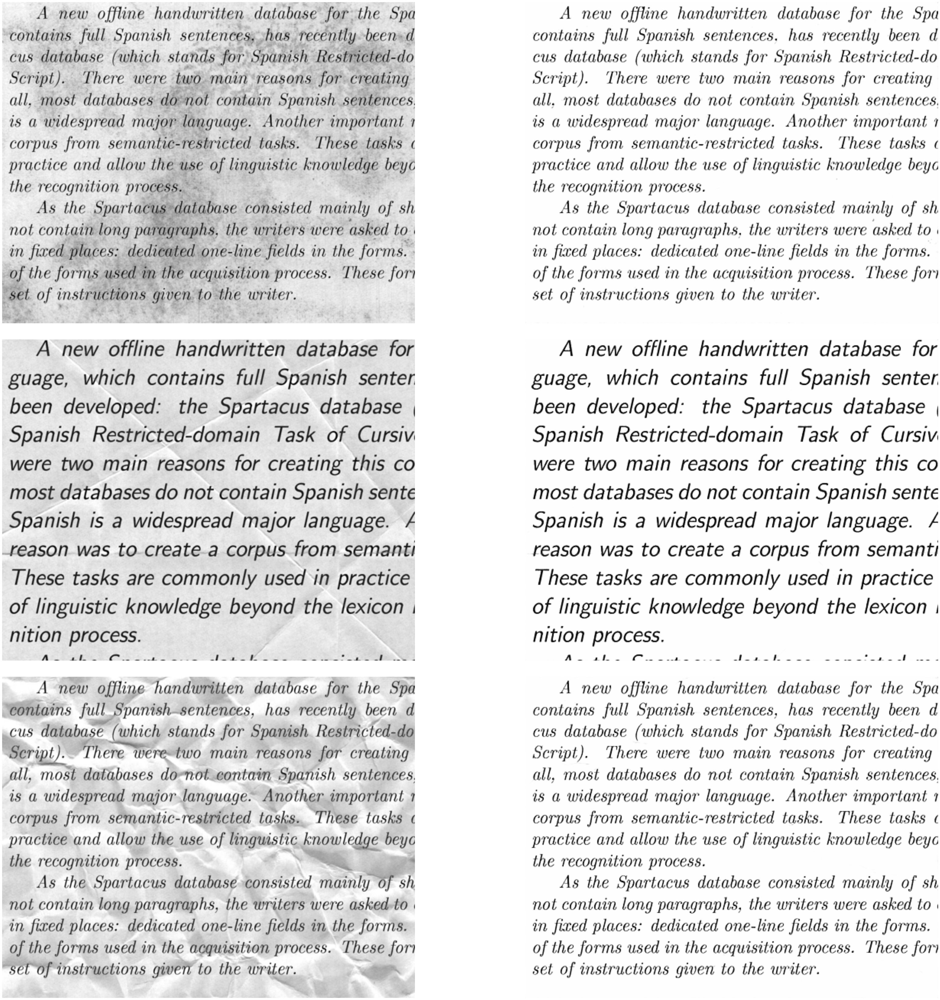

In [25]:
plot_documents_after_training()